# Demonstrating a Simulation in the Minicity Environment
This file is a demo of the `ma_minicity_noise_20p` which I created. It will run for 10 iterations, save the results to a csv and plot some of the more relevant metrics

## Importing the Parameters for the Experiment
This section is mostly some imports and showing the various minicity experiments that were put together

In [1]:
import os
import ray
import json
from copy import deepcopy

# Flow imports 
from flow.utils.rllib import FlowParamsEncoder, get_flow_params
from flow.utils.registry import make_create_env

# Ray imports
from ray import tune
from ray.tune import run_experiments
from ray.tune.registry import register_env
try:
    from ray.rllib.agents.agent import get_agent_class
except ImportError:
    from ray.rllib.agents.registry import get_agent_class
    
# Local imports
from examples.exp_configs.rl.multiagent.ma_minicity_noise_and_penalty import flow_params
from examples.train import parse_args, setup_exps_rllib, train_rllib, main

In [2]:
flags = parse_args('"ma_minicity_noise_20p"')
flags.exp_config = "ma_minicity_noise_20p"
module_ma = __import__("examples.exp_configs.rl.multiagent", fromlist=[flags.exp_config])
submodule = getattr(module_ma, flags.exp_config)

In [3]:
path = 'examples/exp_configs/rl/multiagent'
print('This is the list of environments used for this experiment:')
for file in os.listdir(path):
    if file[:2] == 'ma':
        print(file)

This is the list of environments used for this experiment:
ma_minicity_noise_30p.py
ma_minicity_noise_10p.py
ma2_minicity.py
ma_minicity_noise_and_penalty.py
ma2_minicity_w_noise.py
ma_minicity_noise_20p.py


## Configuring Additional Experiment Parameters
This section configures the various parameters for the experiment to run properly. This includes the parameters for how the experiment will run, the hardware configuration of the computer running the experiment and the environment that it will run in.

In [5]:
n_cpus = 8
n_rollouts = 12
policy_graphs = getattr(submodule, "POLICY_GRAPHS", None)
policy_mapping_fn = getattr(submodule, "policy_mapping_fn", None)
policies_to_train = getattr(submodule, "policies_to_train", None)

horizon = flow_params['env'].horizon
alg_run = "PPO"

agent_cls = get_agent_class(alg_run)
config = deepcopy(agent_cls._default_config)

config["num_workers"] = n_cpus - 1
config["train_batch_size"] = horizon * n_rollouts
config["gamma"] = 0.999  # discount rate
config["model"].update({"fcnet_hiddens": [32, 32, 32]})
config["use_gae"] = True
config["lambda"] = 0.97
config["kl_target"] = 0.02
config["num_sgd_iter"] = 10
config["horizon"] = horizon

# save the flow params for replay
flow_json = json.dumps(
    flow_params, cls=FlowParamsEncoder, sort_keys=True, indent=4)
config['env_config']['flow_params'] = flow_json
config['env_config']['run'] = alg_run

# multiagent configuration
if policy_graphs is not None:
    print("policy_graphs", policy_graphs)
    config['multiagent'].update({'policies': policy_graphs})
if policy_mapping_fn is not None:
    config['multiagent'].update(
        {'policy_mapping_fn': tune.function(policy_mapping_fn)})
if policies_to_train is not None:
    config['multiagent'].update({'policies_to_train': policies_to_train})

create_env, gym_name = make_create_env(params=flow_params)

# Register as rllib env
register_env(gym_name, create_env)

## Running the Experiment
The experiment will run for several training iterations and attempt to improve its reward throughout training iterations

In [6]:
ray.shutdown()
# Make sure ray isn't running from previous experiments
ray.init()

2020-12-14 17:25:01,515	WARNING services.py:597 -- setpgrp failed, processes may not be cleaned up properly: [Errno 1] Operation not permitted.
2020-12-14 17:25:01,545	INFO resource_spec.py:216 -- Starting Ray with 15.62 GiB memory available for workers and up to 7.83 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).


{'node_ip_address': '192.168.0.12',
 'redis_address': '192.168.0.12:51539',
 'object_store_address': '/tmp/ray/session_2020-12-14_17-25-01_513627_8392/sockets/plasma_store',
 'raylet_socket_name': '/tmp/ray/session_2020-12-14_17-25-01_513627_8392/sockets/raylet',
 'webui_url': None,
 'session_dir': '/tmp/ray/session_2020-12-14_17-25-01_513627_8392'}

In [ ]:
trials = run_experiments({
    flow_params["exp_tag"]: {
        "run": alg_run,
        "env": gym_name,
        "config": {
            **config
        },
        "checkpoint_freq": 1,  # number of iterations between checkpoints
        "checkpoint_at_end": True,  # generate a checkpoint at the end
        "max_failures": 999,
        "stop": {  # stopping conditions
            "training_iteration": 10,  # number of iterations to stop after
        },
    },
})

2020-12-14 17:02:46,047	INFO ray_trial_executor.py:121 -- Trial PPO_RyanAccelPOEnv-v0_3e2a4bd2: Setting up new remote runner.


Trial name,status,loc
PPO_RyanAccelPOEnv-v0_3e2a4bd2,RUNNING,


(pid=6467) 2020-12-14 17:02:47,697	INFO trainer.py:371 -- Tip: set 'eager': true or the --eager flag to enable TensorFlow eager execution
(pid=6467) 2020-12-14 17:02:47,993	INFO trainer.py:512 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
(pid=6467) Warning: Target lane 'e_14_0' is already connected from 'e_13'.
(pid=6467) Warning: Target lane 'e_44_0' is already connected from 'e_42'.
(pid=6467) Warning: Target lane 'e_69_0' is already connected from 'e_60'.
(pid=6467) Warning: Speed of turning connection 'e_4_1->e_18_0' reduced by 23.08 due to turning radius of 8.69 (length=14.52 angle=120.37)
(pid=6467) Warning: Speed of straight connection 'e_12_0->e_18_0' reduced by 21.97 due to turning radius of 11.73 (length=8.51 angle=59.63)
(pid=6467) Warning: Speed of turning connection 'e_26_0->e_12_0' reduced by 23.49 due to turning radius of 7.70 (length=9.03 angle=90.00)
(pid=6467) Warning: Speed of turning connection 'e

Trial name,status,loc,iter,total time (s),timesteps,reward
PPO_RyanAccelPOEnv-v0_3e2a4bd2,RUNNING,192.168.0.12:6467,1,99.6782,150616,431.236


(pid=6466) Warning: Vehicle 'rl_13' performs emergency braking with decel=-23.01 wished=4.50 severity=4.11, time=28.00.
(pid=6466) Warning: Vehicle 'idm_14' performs emergency braking with decel=-9.12 wished=4.50 severity=1.03, time=28.25.
(pid=6461) Warning: Vehicle 'idm_38' performs emergency braking with decel=-16.97 wished=4.50 severity=2.77, time=32.50.
(pid=6466) Warning: Vehicle 'rl_37' performs emergency braking with decel=-37.64 wished=4.50 severity=7.36, time=28.50.
(pid=6466) Warning: Vehicle 'idm_37' performs emergency braking with decel=-33.55 wished=4.50 severity=6.46, time=28.75.
(pid=6462) Warning: Vehicle 'idm_29' performs emergency braking with decel=-46.55 wished=4.50 severity=9.35, time=29.25.
(pid=6462) Warning: Vehicle 'rl_18' performs emergency braking with decel=-18.71 wished=4.50 severity=3.16, time=29.25.
(pid=6464) Warning: Vehicle 'idm_21' performs emergency braking with decel=-16.17 wished=4.50 severity=2.59, time=32.50.
(pid=6466) Warning: Vehicle 'rl_54' 

Trial name,status,loc,iter,total time (s),timesteps,reward
PPO_RyanAccelPOEnv-v0_3e2a4bd2,RUNNING,192.168.0.12:6467,2,192.479,302375,398.801


(pid=6463) Warning: Vehicle 'idm_11' performs emergency braking with decel=-28.06 wished=4.50 severity=5.24, time=33.50.
(pid=6462) Warning: Teleporting vehicle 'idm_20'; collision with vehicle 'rl_44', lane=':n_m4_0_0', gap=-1.00, time=51.00 stage=move.
(pid=6464) Warning: Vehicle 'rl_4' performs emergency braking with decel=-15.48 wished=4.50 severity=2.44, time=35.25.
(pid=6462) Warning: Target lane 'e_14_0' is already connected from 'e_13'.
(pid=6462) Warning: Target lane 'e_44_0' is already connected from 'e_42'.
(pid=6462) Warning: Target lane 'e_69_0' is already connected from 'e_60'.
(pid=6468) Warning: Vehicle 'rl_30' performs emergency braking with decel=-65.21 wished=4.50 severity=13.49, time=32.75.
(pid=6462) Warning: Speed of turning connection 'e_4_1->e_18_0' reduced by 23.08 due to turning radius of 8.69 (length=14.52 angle=120.37)
(pid=6462) Warning: Speed of straight connection 'e_12_0->e_18_0' reduced by 21.97 due to turning radius of 11.73 (length=8.51 angle=59.63)
(

Trial name,status,loc,iter,total time (s),timesteps,reward
PPO_RyanAccelPOEnv-v0_3e2a4bd2,RUNNING,192.168.0.12:6467,3,287.495,453802,449.543


(pid=6463) Warning: Vehicle 'rl_91' performs emergency braking with decel=-71.14 wished=4.50 severity=14.81, time=25.75.
(pid=6463) Warning: Vehicle 'rl_59' performs emergency braking with decel=-17.96 wished=4.50 severity=2.99, time=25.75.
(pid=6468) Warning: Vehicle 'rl_55' performs emergency braking with decel=-21.08 wished=4.50 severity=3.68, time=25.75.
(pid=6468) Warning: Vehicle 'idm_10' performs emergency braking with decel=-16.20 wished=4.50 severity=2.60, time=25.75.
(pid=6468) Warning: Vehicle 'rl_45' performs emergency braking with decel=-19.63 wished=4.50 severity=3.36, time=25.75.
(pid=6462) Warning: Vehicle 'idm_35' performs emergency braking with decel=-12.29 wished=4.50 severity=1.73, time=29.00.
(pid=6462) Warning: Vehicle 'idm_30' performs emergency braking with decel=-9.37 wished=4.50 severity=1.08, time=29.00.
(pid=6464) Warning: Vehicle 'idm_19' performs emergency braking with decel=-11.22 wished=4.50 severity=1.49, time=26.50.
(pid=6465) Warning: Vehicle 'idm_6' 

Trial name,status,loc,iter,total time (s),timesteps,reward
PPO_RyanAccelPOEnv-v0_3e2a4bd2,RUNNING,192.168.0.12:6467,4,389.707,606026,463.923


(pid=6463) Warning: Vehicle 'idm_11' performs emergency braking with decel=-13.03 wished=4.50 severity=1.89, time=26.75.
(pid=6466) Warning: Vehicle 'rl_46' performs emergency braking with decel=-10.71 wished=4.50 severity=1.38, time=27.25.
(pid=6466) Warning: Vehicle 'idm_40' performs emergency braking with decel=-9.00 wished=4.50 severity=1.00, time=27.25.
(pid=6463) Warning: Vehicle 'rl_77' performs emergency braking with decel=-9.98 wished=4.50 severity=1.22, time=27.00.
(pid=6463) Warning: Vehicle 'rl_65' performs emergency braking with decel=-10.74 wished=4.50 severity=1.39, time=27.00.
(pid=6466) Warning: Vehicle 'rl_46' performs emergency braking with decel=-14.17 wished=4.50 severity=2.15, time=27.50.
(pid=6463) Warning: Vehicle 'rl_77' performs emergency braking with decel=-69.46 wished=4.50 severity=14.44, time=27.25.
(pid=6462) Warning: Vehicle 'rl_60' performs emergency braking with decel=-13.59 wished=4.50 severity=2.02, time=33.25.
(pid=6462) Warning: Vehicle 'rl_11' per

Trial name,status,loc,iter,total time (s),timesteps,reward
PPO_RyanAccelPOEnv-v0_3e2a4bd2,RUNNING,192.168.0.12:6467,5,502.5,758264,365.043


(pid=6464) Warning: Vehicle 'rl_95' performs emergency braking with decel=-45.60 wished=4.50 severity=9.13, time=27.50.
(pid=6465) Warning: Vehicle 'idm_32' performs emergency braking with decel=-66.05 wished=4.50 severity=13.68, time=36.75.
(pid=6461) Warning: Vehicle 'idm_2' performs emergency braking with decel=-11.02 wished=4.50 severity=1.45, time=28.25.
(pid=6468) Warning: Vehicle 'rl_63' performs emergency braking with decel=-44.76 wished=4.50 severity=8.95, time=38.75.
(pid=6468) Warning: Vehicle 'idm_34' performs emergency braking with decel=-23.81 wished=4.50 severity=4.29, time=38.75.
(pid=6468) Warning: Vehicle 'rl_66' performs emergency braking with decel=-15.75 wished=4.50 severity=2.50, time=38.75.
(pid=6463) Warning: Vehicle 'rl_46' performs emergency braking with decel=-47.96 wished=4.50 severity=9.66, time=33.50.
(pid=6463) Warning: Vehicle 'idm_23' performs emergency braking with decel=-13.81 wished=4.50 severity=2.07, time=33.75.
(pid=6466) Warning: Vehicle 'idm_35'

Trial name,status,loc,iter,total time (s),timesteps,reward
PPO_RyanAccelPOEnv-v0_3e2a4bd2,RUNNING,192.168.0.12:6467,8,800.023,1213846,557.669


(pid=6463) Warning: Vehicle 'rl_11' performs emergency braking with decel=-20.35 wished=4.50 severity=3.52, time=25.50.
(pid=6463) Warning: Vehicle 'idm_31' performs emergency braking with decel=-21.80 wished=4.50 severity=3.85, time=25.50.
(pid=6464) Warning: Teleporting vehicle 'idm_13'; collision with vehicle 'rl_76', lane=':n_r6_1_0', gap=-1.00, time=46.00 stage=move.
(pid=6464) Warning: Vehicle 'idm_13' ends teleporting on edge 'e_66', time 46.00.
(pid=6465) Warning: Vehicle 'rl_21' performs emergency braking with decel=-72.76 wished=4.50 severity=15.17, time=31.25.
(pid=6465) Warning: Vehicle 'rl_5' performs emergency braking with decel=-28.49 wished=4.50 severity=5.33, time=31.25.
(pid=6463) Warning: Vehicle 'idm_31' performs emergency braking with decel=-32.24 wished=4.50 severity=6.17, time=25.75.
(pid=6463) Warning: Vehicle 'rl_67' performs emergency braking with decel=-25.52 wished=4.50 severity=4.67, time=25.75.
(pid=6463) Warning: Vehicle 'idm_21' performs emergency brakin

Trial name,status,loc,iter,total time (s),timesteps,reward
PPO_RyanAccelPOEnv-v0_3e2a4bd2,RUNNING,192.168.0.12:6467,9,902.248,1366284,489.796


(pid=6463) Warning: Vehicle 'idm_37' performs emergency braking with decel=-9.39 wished=4.50 severity=1.09, time=51.00.
(pid=6462) Warning: Vehicle 'idm_10' performs emergency braking with decel=-13.67 wished=4.50 severity=2.04, time=27.50.
(pid=6462) Warning: Vehicle 'rl_73' performs emergency braking with decel=-12.19 wished=4.50 severity=1.71, time=27.50.
(pid=6463) Warning: Vehicle 'rl_6' performs emergency braking with decel=-13.75 wished=4.50 severity=2.06, time=52.00.
(pid=6466) Warning: Vehicle 'rl_53' performs emergency braking with decel=-9.63 wished=4.50 severity=1.14, time=45.25.
(pid=6462) Warning: Vehicle 'rl_65' performs emergency braking with decel=-13.96 wished=4.50 severity=2.10, time=29.50.
(pid=6461) Warning: Vehicle 'idm_3' performs emergency braking with decel=-22.44 wished=4.50 severity=3.99, time=29.25.
(pid=6464) Warning: Vehicle 'idm_31' performs emergency braking with decel=-12.58 wished=4.50 severity=1.80, time=37.50.
(pid=6468) Warning: Vehicle 'idm_21' per

## Viewing the Results
Since the experiment saved the results in the `~/ray_results` directory we can find the experiment and load the csv to see various metrics about the training process.

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

In [8]:
results_path = '~/ray_results/minicity/PPO_RyanAccelPOEnv-v0_3e2a4bd2_2020-12-14_17-02-46ymhsi6sh/'
results_df = pd.read_csv(results_path + 'progress.csv')
results_df

,episode_reward_max,episode_reward_min,episode_reward_mean,episode_len_mean,episodes_this_iter,timesteps_this_iter,done,timesteps_total,episodes_total,training_iteration,...,perf/ram_util_percent,info/learner/default_policy/cur_kl_coeff,info/learner/default_policy/cur_lr,info/learner/default_policy/total_loss,info/learner/default_policy/policy_loss,info/learner/default_policy/vf_loss,info/learner/default_policy/vf_explained_var,info/learner/default_policy/kl,info/learner/default_policy/entropy,info/learner/default_policy/entropy_coeff
0,2191.525796,-1341.000000,431.235803,42.064516,31,150616,False,150616,31,1,...,18.637063,0.200000,0.00005,527.503100,-0.000025,527.50310,-0.463899,0.000177,1.418811,0.0
1,3340.304158,-2439.600000,398.800796,41.623188,38,151759,False,302375,69,2,...,19.109848,0.100000,0.00005,586.788200,-0.001194,586.78910,-0.123089,0.002356,1.414995,0.0
2,3340.304158,-3714.500000,449.543476,43.250000,37,151427,False,453802,106,3,...,19.325000,0.050000,0.00005,202.892580,-0.000345,202.89285,-0.060971,0.001528,1.419220,0.0
3,2762.404079,-3714.500000,463.923455,40.450000,38,152224,False,606026,144,4,...,19.457534,0.025000,0.00005,759.767600,-0.000303,759.76790,-0.065516,0.001074,1.404270,0.0
4,2860.680189,-3173.621294,365.042995,32.410000,58,152238,False,758264,202,5,...,19.670625,0.012500,0.00005,134.190660,-0.000258,134.19089,0.004207,0.001583,1.395520,0.0
5,2860.680189,-1155.600000,457.703202,32.200000,43,152177,False,910441,245,6,...,19.802759,0.006250,0.00005,120.561880,-0.000564,120.56243,-0.008582,0.002970,1.411923,0.0
6,2847.050884,-1155.600000,497.896176,33.340000,39,151508,False,1061949,284,7,...,20.055556,0.003125,0.00005,44.663330,-0.000240,44.66356,-0.001709,0.001795,1.407076,0.0
7,2847.050884,-2437.400000,557.669127,37.260000,39,151897,False,1213846,323,8,...,20.148819,0.001563,0.00005,251.645300,-0.000490,251.64577,0.015769,0.003597,1.388815,0.0
8,3926.024341,-2437.400000,489.795830,37.400000,39,152438,False,1366284,362,9,...,20.213014,0.000781,0.00005,204.313310,-0.000563,204.31389,0.003897,0.002905,1.390789,0.0
9,3926.024341,-2437.400000,606.297747,43.840000,33,151956,True,1518240,395,10,...,20.350000,0.000391,0.00005,94.647835,-0.000655,94.64848,0.008532,0.003243,1.389634,0.0


### Rewards

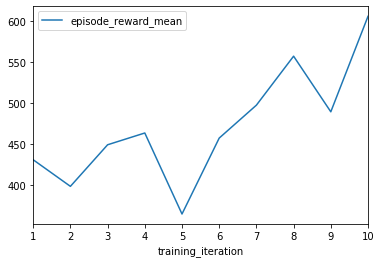

In [10]:
results_df.plot('training_iteration', 'episode_reward_mean')

Here we can see that the reward increased over 10 training episodes. For this short of a training period the amount isn't too crucial, but the upward trend shows that the model is improving

### Explained Variance

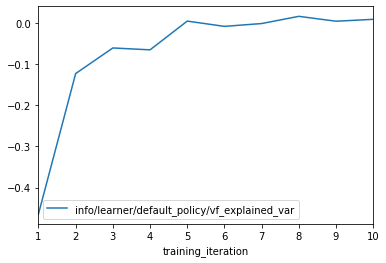

In [12]:
results_df.plot('training_iteration', 'info/learner/default_policy/vf_explained_var')

The explained variance starts off negative since the model doesn't know how much to expect initially and any deviation in the test runs would make this negative. After that the model approaches zero. Ideally with a larger batch size and more training iterations this value would converge to some positive number which correllates to the observed variance in the model for a given iteration